# Continuous assessment:  Natural patterns

Patterns occur everywhere in nature: from snowflakes and leopards' coat to the large-scale of the universe. One of the first scientists to present mathematical models describing the interaction between chemicals and its relation with morphogenesis was Alan Turing in his seminal paper entitled _"The Chemical Basis of Morphogenesis"_ (Phil Trans Royal Soc London (B), 237(641):37-72, 1952; available [here](https://www.dna.caltech.edu/courses/cs191/paperscs191/turing.pdf)). Turing suggested that, under certain conditions, chemicals can react and diffuse in such a way that they produce spatial patterns of chemical or morphogen concentrations. Mathematically, this is expressed by the following system of equations:

<br />

\begin{align*}
&\frac{\partial U}{\partial t}=F(U,V)+D_u \nabla^2 U,\\
&\frac{\partial V}{\partial t}=G(U,V)+D_v \nabla^2 V,
\end{align*}

<br />

where $U$ and $V$ are the chemicals diffusing and reacting, and $F$ and $G$ are the nonlinear kinetics functions. In this assignment, you will solve these equations and see how it can lead to very interesting patterns.

---

***1.*** Explain the meaning of these equations and what each variable is. Which initial/boundary conditions are needed for solving it? **[10]**

***Hint***: Yes, you can look in the Internet. In particular, this [link](https://phylogenous.wordpress.com/2010/12/01/alan-turings-reaction-diffusion-model-simplification-of-the-complex/) may be helpful.

<br />

***2.*** In a first instance, we can employ Euler's method to solve the system of equations. Show that, in that case, we get the following discretisation for $U$:

<br />

$$
U_{i,j}^{n+1}=U_{i,j}^{n}+h_t \left[F(U_{i,j}^{n},V_{i,j}^{n})+D_u (\nabla^2 U)_{i,j}^{n}\right],
$$

<br />

where $(\nabla^2 U)_{i,j}^{n}$ is the $O(h^2)$ discretisation of the Laplacian. What is the discretisation for $V$? **[20]**

<br />

***3.*** In order to obtain realistic results, we need to impose sensible boundary conditions (BCs). It is a common practice in the field to employ periodic BCs. Assuming a squared lattice, these conditions ensure that the solution on the right side equals that of the left (likewise for the top and bottom sides). Explain why the following function implements such conditions to the solution array ```W```. **[20]**

<br />

```python
def periodic(W):
    W2 = W.copy()
    W2[-1, :] = W[1, :]
    W2[0, :] = W[-2, :]
    W2[:, -1] = W[:, 1]
    W2[:, 0] = W[:, -2]
    return W2
```

<br />

***4.*** Before simulating, we need to generate the initial condition (IC) data. This is non trivial, since it contains a random variable that allows to obtain different results each time the code is ran (although leopards seem to have the very same coating pattern, they are unique, as our fingerprints!). Generate a callable function in Python ```init_cond(l, dl, tf, dt)``` whose output are two 2D arrays representing the ICs for $U$ and $V$ according the following recipe:

* Initialise U and V as $n \times n$ arrays, the first full of zeros and the second full of ones.
* Change the values of the 20 by 20 mesh point area located symmetrically about the centre of the arrays to 0.5 and 0.25 for U and V, respectively.
* Add random noise to both arrays using the ```random.random``` function within Numpy. E.g., in the case of U, 

```python
U += .01 * np.random.random((nx, nx))
```


(Value: **[20]**) 

<br />

***5.*** Now, we are ready to simulate! We will utilise the Gray-Scott model to describe the interaction between chemicals, given by:

<br />

\begin{align*}
&F(U,V)=-UV^2+f(1-U),\\
&G(U,V)=UV^2-(f+k)V,
\end{align*}

<br />

where $k$ is the dimensionless rate constant of the second reaction and $f$ is the dimensionless feed rate (both given; for more details, see Pearson, Science, 261(5118):189-92, 1993). Write a callable function ```Euler(U, V, tf, dt, dl)``` in Python for solving the _reaction-diffusion_ equation in a square lattice using Euler's method. Generate an animation showing the time evolution for $V(t;x,y)$ between $t_0=0$ and $t_f=20000$ (you can use the ```anim_2D``` function from Lab 9!), and using the following sets of parameters:

  * $D_u = 0.14,\ D_v = 0.06,\ f=0.06,\ k=0.062.$
  * $D_u = 0.07,\ D_v = 0.03,\ f=0.06,\ k=0.062.$
  * $D_u = 0.12,\ D_v = 0.08,\ f=0.02,\ k=0.05.$
  * $D_u = 0.1,\ D_v = 0.05,\ f=0.035,\ k=0.065.$
  * $D_u = 0.16,\ ;D_v = 0.08,\ f=0.02,\ k=0.055.$
  * $D_u = 0.16,\ D_v = 0.08,\ f=0.054,\ k=0.064.$ (you may need to utilise $t_f=80000$ in this case)


Consider $l=150$, $dx=1$, and $dt=1$. If possible, try to avoid _looping_ through space points. What do results resemble of? **[30]**

***Hints***: The function ```Euler``` should:

* Compute the number of time iteration points based on the inputs.
* Pre-allocate memory for the 2D+t output in a 3D array.
* Set the initial condition within the 3D array (i.e., for the first time point).
* Within a ```for``` loop:
    * Update the values inside the grid for U and V (i.e., ```U[1:-1,1:-1]``` and ```V[1:-1,1:-1]```, for applying the BCs).
    * Impose the periodic BCs to U and V.
    * Save the result for V in the pre-allocated array. 



# Answers

## Question 1.

Reaction-diffusion systems are mathematical models that describe how one or more
substances distributed in space change under the influence of two processes: 

1) Difussion (local movement)

2) Reaction (Growth, interactions, changes of state)

In R-D equations ,$U$ and $V$ are vectors that represents the concentration of the chemical substances.Making use of the suggested literature from the exercise(“The Chemical Basis of Morphogenesis" 1952 by Alan Turing) we find that in our case $U$ and $V$ are molecules called morphogen, one “locally activated”($U$) and the other capable of “long-range inhibition($V$).




$\frac{\partial U}{\partial t}$ and $\frac{\partial V}{\partial t}$ represents the rate of concentration change for each chemical.


$F(U,V)$ and $G(U,V)$ represents the nonlinear kinetics functions that categorizes the reaction( rate of production- rate of degradation ),i.e interaction between chemicals


$D_u \nabla^2 U$ and $D_v \nabla^2 V$ represents the the rates of diffusion with  $D_u $ y $D_v$ as the difussion coefficients for $U$ and $V$ respectively.

Without a preformed pattern, these equations will illustrate pattern forming.
In order to solve this equations,we need to stablish initial conditions for both substances.One initial conditions could be to choose  random distribution of both substances.

## Question 2

We have:

$\frac{\partial U}{\partial t}=F(U,V)+D_u \nabla^2 U $

We know:
 
$\frac{\partial U}{\partial t}≈ \frac{U_{i,j}^{n+1}  - U_{i,j}^{n}  }{h_t} $
 
so,

$\frac{U_{i,j}^{n+1}  - U_{i,j}^{n}  }{h_t}  = F(U_{i,j}^{n},V_{i,j}^{n})+D_u (\nabla^2 U)_{i,j}^{n} $

so,

$U_{i,j}^{n+1}  - U_{i,j}^{n} = h_t \left[F(U_{i,j}^{n},V_{i,j}^{n})+D_u (\nabla^2 U)_{i,j}^{n}\right] $

And finally we got:

$U_{i,j}^{n+1}   = U_{i,j}^{n} + h_t \left[F(U_{i,j}^{n},V_{i,j}^{n})+D_u (\nabla^2 U)_{i,j}^{n}\right] $


Following exactly the same procedure we have for $V$:

$V_{i,j}^{n+1}   = V_{i,j}^{n} + h_t \left[G(U_{i,j}^{n},V_{i,j}^{n})+D_v (\nabla^2 V)_{i,j}^{n}\right] $

## Question 3

BCs tries to represent with its use is an infinite domain, by joining opposite edges so that the end of the domain in one of them means the beginning of the same in the other. The following image represents the periodical sensitive conditions in case of application to a lattice:



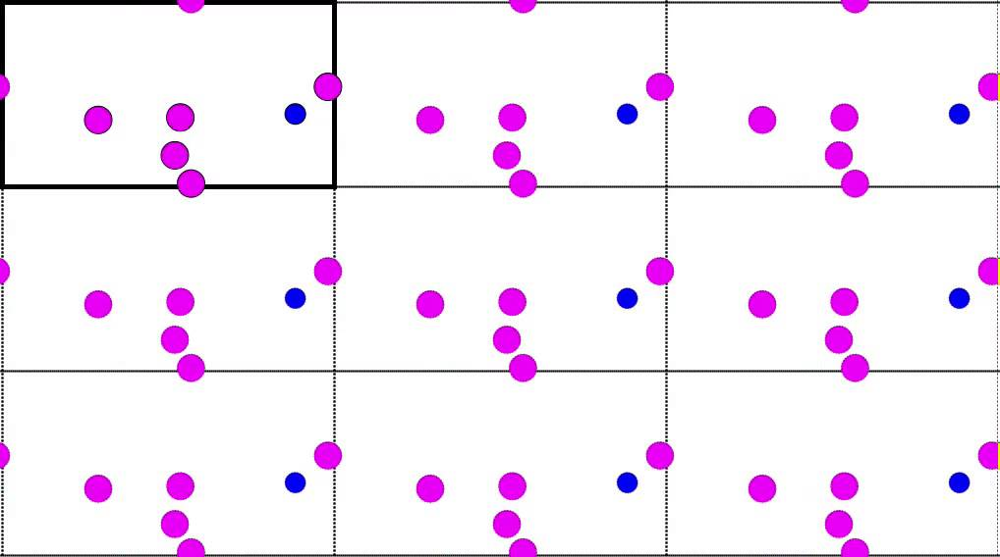

In [91]:
from IPython.display import display, Image
display(Image(filename='anaconda.jpg'))


We can see from the code that the function take as an input a numpy matrix array nxn, which represent the squared lattice,an return another numppu array matrix nxn that asses sensible BCs.Lets analyze the function line by line:

First the function does W2 = W.copy() 

That is done in order to make a exact copy of the input lattice and save it into a new variable. The function  works changing W2 edges,which is  the oupot variable,once the sensible BCs are implement in the new W2 squared lattice.



To ahieve that we need to interpret the code as follow:

W2[-1, :] down edge array points of  the new square lattice have to be equal = W[1, :], penultime up edge array points of the original square lattice.

W2[0, :] up edge of the new lattice square has to be equal=W[-2, :], penultime down edge array points of the original square lattice.

W2[:, -1] right edge of new square lattice the squrare has to be equal= W[:, 1], penultime left edge array points of the original square lattice.

W2[:, 0] lef edge of the new square square lattice has to be equal=W[:, -2], penultime right edge array points of the original square lattice.

Finally,the funcion reuturn the new lattice W2 with the BCs conditions met.

 

## Question 4

In [2]:
import numpy as np
import matplotlib.pyplot as plt 
import numpy as np
import matplotlib.pyplot as plt
import matplotlib.animation as animation
from IPython.display import HTML 
from matplotlib import animation, rc

def init_cond(l, dl, tf, dt):
    n=l
    U=np.ones((n, n))
    V=np.zeros((n, n))
    centerposition=round(n/2)     #we use round For finding the excat position (or approx in case of n odd)
    for i in range(centerposition-10,centerposition+10):
        for j in range(centerposition-10,centerposition+10):
            U[i,j]=0.5
            V[i,j]=0.25
    U += .01 * np.random.random((n, n))
    V += .01 * np.random.random((n, n))
    
    return U,V

## Question 5

In [3]:
def Euler(l,dl,t, dt,Du,Dv,f,k):         #We define the Euler function
   
    x= np.arange(0, l+dl, dl)
    y = x.copy()
    xx, yy = np.meshgrid(x, y)
    
    
    u = np.zeros((t.shape[0],x.shape[0],y.shape[0]),dtype= np.float32)
    v = np.zeros((t.shape[0],x.shape[0],y.shape[0]),dtype= np.float32)
    
    u[0,:,:] = init_cond(l+1, 0, 0, 0)[0]
    u[0,:,:] = periodic(u[0,:,:])
    
    v[0,:,:] = init_cond(l+1, 0, 0, 0)[1]
    v[0,:,:] = periodic(v[0,:,:])
    
    for s in range(len(t)-1):
        u[s+1,1:-1,1:-1] = u[s,1:-1,1:-1] + dt * fu(u[s,:,:],v[s,:,:], Du , Dv, dl, dl, f,k)
        v[s+1,1:-1,1:-1] = v[s,1:-1,1:-1] + dt * fv(u[s,:,:],v[s,:,:], Du,  Dv, dl, dl, f,k)
        u[s+1,:,:] = periodic(u[s+1,:,:])
        v[s+1,:,:] = periodic(v[s+1,:,:])
    return v


#We define the following functions that we will use in the Euler method:

def fu(u,v,Du,Dv, hx, hy,f,k):           
    uxx = (u[0:-2,1:-1]+u[2::,1:-1]-2*u[1:-1,1:-1]) / hx**2
    uyy = (u[1:-1,0:-2]+u[1:-1,2::]-2*u[1:-1,1:-1]) / hy**2
    return (((-u[1:-1,1:-1])*((v[1:-1,1:-1])**2)) + f*(1-u[1:-1,1:-1]) +Du*(uxx+uyy))    

def fv(u,v,Du,Dv, hx, hy,f,k):
    vxx = (v[0:-2,1:-1]+v[2::,1:-1]-2*v[1:-1,1:-1]) / hx**2
    vyy = (v[1:-1,0:-2]+v[1:-1,2::]-2*v[1:-1,1:-1]) / hy**2
    return ((u[1:-1,1:-1])*((v[1:-1,1:-1])**2)   -(f+k)*(v[1:-1,1:-1]) +Dv*(vxx+vyy))    

#Function given by the question for the BCs conditions

def periodic(W):
    W2 = W.copy()
    W2[-1, :] = W[1, :]
    W2[0, :] = W[-2, :]
    W2[:, -1] = W[:, 1]
    W2[:, 0] = W[:, -2]
    return W2

#Function propose by the question for creating the animations(from LECTURE 9 notes)


def anim_2D(V):
    fig = plt.figure(figsize=(5, 5)); ax = plt.subplot() # create figure and axes handle
    quad = plt.pcolormesh(V[0],vmax=0.1); plt.axis('image') # initial plot
    ax.set_xticks([]); ax.set_yticks([]); clb = plt.colorbar(); 
    ax.text(195, 70, 'V', color='black', fontsize=12)
    plt.xlabel('$Vx$', fontsize=12); plt.ylabel('$Vy$', fontsize=12);
    

    def init():
        quad.set_array([])
        return quad

    def animate(iter):
        quad.set_array(V[iter*3,:,:].ravel())
        return quad

    anim = animation.FuncAnimation(fig, animate, frames=np.int(V.shape[0]/3), 
                                   interval=1, blit=False, repeat=False)
    plt.close(anim._fig)
    
    return anim



In [5]:
#######Parameters given by the excercise########

l=150
dl=1
dt=1
tf=20000 #This will rematin constant(except the time for the final parameter set t=80000)



######This  paramers will change##########
Du_array=[0.14,0.07,0.12,0.1,0.16,0.16]
Dv_array=[0.06,0.03,0.08,0.05,0.08,0.08]
f_array=[0.06,0.06,0.02,0.035,0.02,0.054]
k_array=[0.062,0.062,0.05,0.065,0.055,0.064]



t = np.arange(0, tf+dt, dt)




In [6]:
################### Now we are gonna create the following six animations for each parameter set:  ################

In [7]:
t = np.arange(0, tf+dt, dt)


result1=Euler(l,dl,t, dt,Du_array[0],Dv_array[0],f_array[0],k_array[0])
result2=Euler(l,dl,t, dt,Du_array[1],Dv_array[1],f_array[1],k_array[1])
result3=Euler(l,dl,t, dt,Du_array[2],Dv_array[2],f_array[2],k_array[2])
result4=Euler(l,dl,t, dt,Du_array[3],Dv_array[3],f_array[3],k_array[3])
result5=Euler(l,dl,t, dt,Du_array[4],Dv_array[4],f_array[4],k_array[4])



ani1=anim_2D(result1)
ani2=anim_2D(result2)
ani3=anim_2D(result3)
ani4=anim_2D(result4)
ani5=anim_2D(result5)


# Solutions:

# For  $D_u = 0.14,\ D_v = 0.06,\ f=0.06,\ k=0.062.$


In [12]:
HTML(ani1.to_html5_video())  

# For $D_u = 0.07,\ D_v = 0.03,\ f=0.06,\ k=0.062.$

In [11]:
HTML(ani2.to_html5_video())  

# For $D_u = 0.12,\ D_v = 0.08,\ f=0.02,\ k=0.05.$

In [8]:
HTML(ani3.to_html5_video())  

# For $D_u = 0.1,\ D_v = 0.05,\ f=0.035,\ k=0.065.$

In [9]:
HTML(ani4.to_html5_video())  

# For $D_u = 0.16,\ ;D_v = 0.08,\ f=0.02,\ k=0.055.$

In [10]:
HTML(ani5.to_html5_video())  

# For $D_u = 0.16,\ D_v = 0.08,\ f=0.054,\ k=0.064.$ ( $t_f=80000$ in this case)

In [ ]:
t_especial= np.arange(0, 80000, 1)
result6=Euler(l,dl,t_especial, dt,Du_array[5],Dv_array[5],f_array[5],k_array[5])
ani6=anim_2D(result6)
 

In [90]:

HTML(ani6.to_html5_video()) 

*I am getting memory error when running this bit of code. I have tried in a powerfull computer and it works without any problem. I have also tried to save memory in the images using np.float32 insted of np.float64. If more resolution is required then this change should be considered.


# Conclusions

We can observe in the figures above how Turing patterns are observed and how they change as we alter the parameters.we can see how these patterns remind to snowflakes,leopard skin,zebra stripese,etc...

Turing explained that patterns are formed because of the interactions between two chemicals that spread inside a system.
Turing represents the competition between the activation of a compound X and the inhibition of a Compound Y. In order for this pattern to develop, the inhibitor must spread faster than the activator, because from
otherwise, the inhibitor would completely exhaust the presence of X in the region and the reaction would be ove.